# Structural analysis

This is a detailed tutorial for structural analysis of individual images and movies using the the SarcAsM Python package.

Detailed documentation of all functions with parameters and output see [API reference](../autoapi/sarcasm/structure/index.html#sarcasm.structure.Structure).

A detailed list of all analyzed features can be found [here](../structure_features.rst).

Download the Jupyter notebook [here](https://github.com/danihae/SarcAsM/tree/main/docs/notebooks).

In [1]:
from sarcasm import *
from matplotlib import pyplot as plt

## Initialization of SarcAsM object

If SarcAsM is not able to automatically read the pixel size from the tif-file, an error is raised and the pixel size in µm must be entered manually by `Structure(filepath, pixelsize=0.1)`. Additional metadata can be added upon initialization by keyword arguments, e.g., `Structure(filepath, cell_line='WT')`.

All parameters see [API reference](../autoapi/sarcasm/core/index.html#sarcasm.structure.Structure).

In [2]:
# enter path of tif-file, can be both single image and movie
filepath = '../../_test_data/20211115_ACTN2_CMs_96well_control_12days.tif'

# initialize Structure object
sarc = Structure(filepath)

## Prediction of sarcomere Z-bands and cell area by deep learning

SarcAsM predicts Z-bands, M-bands, sarcomere orientation and cell mask from fluorescent images using a U-Net convolutional neural network, by `sarc.detect_sarcomeres()`. By default, a generalist model trained on a diverse data set, is used. To specify the model, adapt `model_path`.

All parameters see [API reference](../autoapi/sarcasm/structure/index.html#sarcasm.structure.Structure.detect_sarcomeres).

In [3]:
# detect sarcomeres and cell mask
sarc.detect_sarcomeres(max_patch_size=(2048, 2048))


Predicting sarcomeres ...


100%|██████████| 50/50 [01:52<00:00,  2.25s/it]


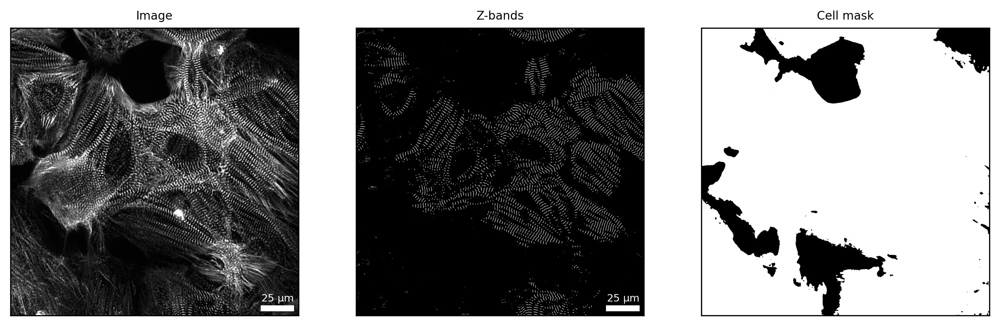

In [4]:
# visualize sarcomere z-bands and cell mask
fig, axs = plt.subplots(ncols=3, figsize=(12, 4), dpi=300)

frame = 33

# image
Plots.plot_image(axs[0], sarc, frame=frame, title='Image')

# z-bands
Plots.plot_z_bands(axs[1], sarc, frame=frame, title='Z-bands', cmap='Grays_r')

# cell mask
Plots.plot_cell_mask(axs[2], sarc, frame=frame, title='Cell mask')

plt.show()

## Analysis of cell mask

By `sarc.analyze_cell_mask()`, SarcAsM analyzes the cell mask area, the area ratio occupied by cells and the mean cell intensity in each image.

Function parameters are described in [API reference](../autoapi/sarcasm/structure/index.html#sarcasm.structure.Structure.analyze_cell_mask).

In [5]:
# analyze cell mask
sarc.analyze_cell_mask()

## Analysis of sarcomere Z-bands

By `sarc.analyze_z_bands()`, SarcAsM segments individual Z-bands and analyzes their length, intensity, orientation and straightness as well as the lateral alignment and distance between neighboring Z-bands and properties of laterally aligned Z-bands.

Function parameters are described in [API reference](../autoapi/sarcasm/structure/index.html#sarcasm.structure.Structure.analyze_z_bands).

In [6]:
# analyze z-bands
sarc.analyze_z_bands()


Starting Z-band analysis...


100%|██████████| 50/50 [02:07<00:00,  2.54s/it]


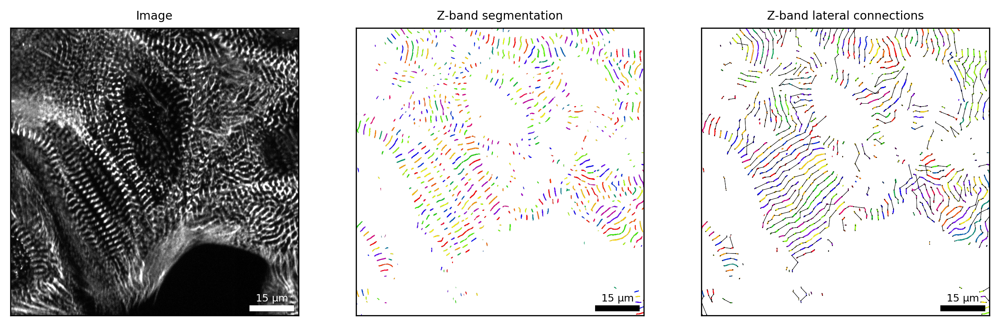

In [7]:
# visualize z-band segmentation and lateral connections
fig, axs = plt.subplots(ncols=3, figsize=(12, 4), dpi=300)

frame = 33

xlim, ylim = (300, 1200), (300, 1200)

# image
Plots.plot_image(axs[0], sarc, frame=frame, title='Image')
axs[0].set_xlim(xlim)
axs[0].set_ylim(ylim)

# z-band segmentation
Plots.plot_z_segmentation(axs[1], sarc, frame=frame, title='Z-band segmentation')
axs[1].set_xlim(xlim)
axs[1].set_ylim(ylim)

# lateral connections
Plots.plot_z_lateral_connections(axs[2], sarc, frame=frame, title='Z-band lateral connections')
axs[2].set_xlim(xlim)
axs[2].set_ylim(ylim)

plt.show()

## Analysis of sarcomere vectors

By `sarc.analyze_sarcomere_vectors()`, SarcAsM locally analyzes sarcomere lengths and orientations, based on sarcomere Z-bands and orientations detected by deep learning.

All parameters are described in [API reference](../autoapi/sarcasm/structure/index.html#sarcasm.structure.Structure.analyze_sarcomere_vectors).

In [8]:
# analysis of sarcomere vectors
sarc.analyze_sarcomere_vectors()


Starting sarcomere length and orientation analysis...


100%|██████████| 50/50 [02:17<00:00,  2.75s/it]


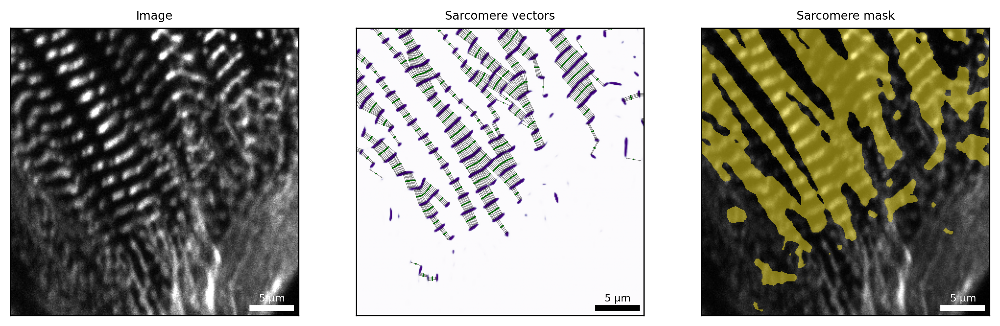

In [9]:
# visualize sarcomere vectors
fig, axs = plt.subplots(ncols=3, figsize=(12, 4), dpi=300)

frame = 33

xlim, ylim = (500, 800), (400, 700)

# image
Plots.plot_image(axs[0], sarc, frame=frame, title='Image')
axs[0].set_xlim(xlim)
axs[0].set_ylim(ylim)

# sarcomere vectors (adjust parameters 'linewidths' and 's_points')
Plots.plot_sarcomere_vectors(axs[1], sarc, frame=frame, s_points=10, title='Sarcomere vectors')
axs[1].set_xlim(xlim)
axs[1].set_ylim(ylim)

# sarcomere mask
Plots.plot_sarcomere_mask(axs[2], sarc, frame=frame, title='Sarcomere mask')
axs[2].set_xlim(xlim)
axs[2].set_ylim(ylim)

plt.show()

## Analysis of myofibrils

By `sarc.analyze_myofibrils()`, SarcAsM estimates the position, length and curvature of myofibrils using a custom line growth algorithm based on sarcomere vectors.

All parameters are described in [API reference](../autoapi/sarcasm/structure/index.html#sarcasm.structure.Structure.analyze_myofibrils).

In [10]:
# myofibril analysis
sarc.analyze_myofibrils()


Starting myofibril line analysis...


100%|██████████| 50/50 [01:29<00:00,  1.80s/it]


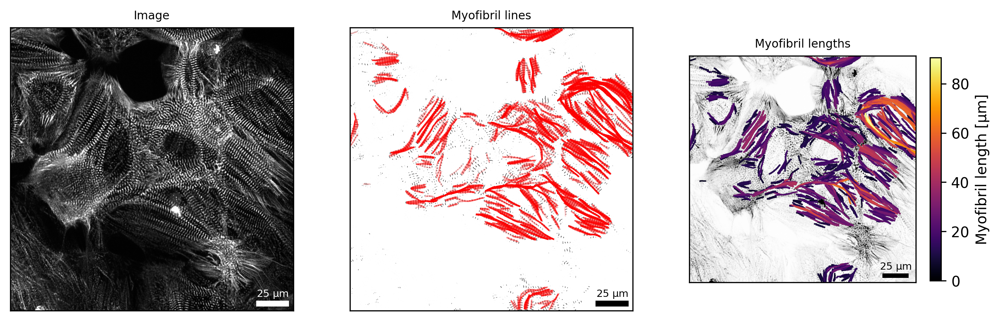

In [11]:
# visualize myofibrils
fig, axs = plt.subplots(ncols=3, figsize=(12, 4), dpi=300)

frame = 33

# image
Plots.plot_image(axs[0], sarc, frame=frame, title='Image')

# myofibril lines
Plots.plot_myofibril_lines(axs[1], sarc, frame=frame, title='Myofibril lines')

# myofibril length map
Plots.plot_myofibril_length_map(axs[2], sarc, frame=frame, title='Myofibril lengths')

plt.show()

## Clustering of sarcomere domains

By `sarc.analyze_sarcomere_domains()`, SarcAsM groups sarcomere vectors into spatial domains with similar orientation using clustering.

All parameters are described in [API reference](../autoapi/sarcasm/structure/index.html#sarcasm.structure.Structure.analyze_sarcomere_domains).

In [12]:
# analyze sarcomere domains
sarc.analyze_sarcomere_domains()


Starting sarcomere domain analysis...


100%|██████████| 50/50 [01:01<00:00,  1.24s/it]


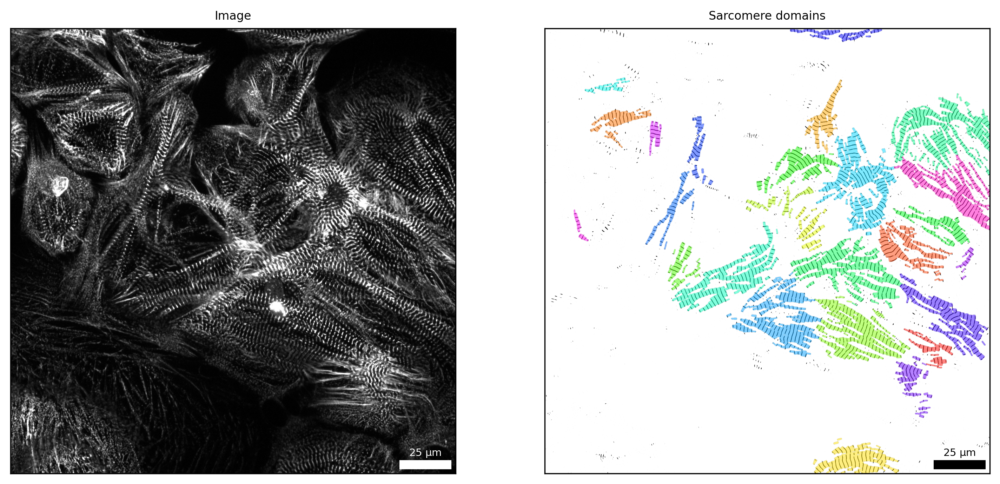

In [13]:
# visualize sarcomere domains
fig, axs = plt.subplots(ncols=2, figsize=(12, 6), dpi=300)

frame = 30

# image
Plots.plot_image(axs[0], sarc, frame=frame, title='Image')

# myofibril lines
Plots.plot_sarcomere_domains(axs[1], sarc, frame=frame, title='Sarcomere domains')

plt.show()